**Imports**

In [101]:
# Imports:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
from shapely.geometry import Polygon, LineString
import matplotlib.patches as patches
from skimage.feature import local_binary_pattern
from collections import Counter


def get_overlapping_values(filtered_image, defect_polygon):
    # Generate polygon mask:
    mask = np.zeros(filtered_image.shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask, [defect_polygon], 255)

    # Extract overlapping pixel values:
    overlapping_values = filtered_image[mask == 255]
    overlapping_values = overlapping_values.tolist()
    
    return overlapping_values

def get_relative_frequencies(values: list) -> dict:
    
    counts = Counter(values)
    total_count = len(values)
    relative_frequencies = {element: count / total_count for element, count in counts.items()}
    return relative_frequencies

def visualize_image_with_defect(image, defect_polygon):
    fig, ax = plt.subplots(1, figsize=(10,10))
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    polygon = patches.Polygon(defect_polygon, closed=True, edgecolor='black', fill=False, linewidth=2)
    ax.add_patch(polygon)
    defect_rect_coords = np.array(list(Polygon(defect_polygon).minimum_rotated_rectangle.exterior.coords)[:-1])
    defect_rect = patches.Polygon(defect_rect_coords, closed=True, edgecolor='black', fill=False, linewidth=2)
    ax.add_patch(defect_rect)
    plt.axis('off')
    plt.show()


**Hough lines function**

In [3]:
# Hough lines function:
def hough_lines_detector(image):
    
    # Read in image as greyscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Blur image:
    blurred_image = cv2.GaussianBlur(gray_image, (7, 7), 0)

    # Apply edge detector:
    edges = cv2.Canny(blurred_image, 50, 150)
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg
    
    # Apply morphological operations: dilate
    kernel = np.ones((10, 10), np.uint8)
    edges = cv2.dilate(edges, kernel, iterations=1)
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    # Apply morphological operations: erode
    kernel = np.ones((8, 8), np.uint8)
    edges = cv2.erode(edges, kernel, iterations=1)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg
    
    # Hough Lines detector:
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=100, minLineLength=50, maxLineGap=10)
    if lines is not None: 
        print(len(lines))
    print(lines)
    image_lines = image.copy()

    # Convert lines into cartesian system:
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(image_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)
    image_lines_rgb = cv2.cvtColor(image_lines, cv2.COLOR_BGR2RGB)

    # Visualization of lines:
    plt.figure(figsize=(10, 10))
    plt.imshow(image_lines_rgb)
    plt.title('Detected Lines')
    plt.axis('off')
    plt.show()



**Color features**

In [54]:
# Function to identify metallic / silver areas in an image: 
def metallic_image_filter_with_visualizations(image):

    def color_detector(image, lower_bounds: list, upper_bounds: list) -> list:
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)
        for lower_bound, upper_bound in zip(lower_bounds, upper_bounds):
            lower_bound = np.array(lower_bound)
            upper_bound = np.array(upper_bound)
            temp_mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
            mask = cv2.bitwise_or(mask, temp_mask)
            print(mask)
        return mask

    metallic_lower_bounds = [[90, 5, 120], [20, 10, 150]]
    metallic_upper_bounds = [[120, 60, 240], [130, 60, 220]]
    metallic_areas = color_detector(image, metallic_lower_bounds, metallic_upper_bounds)
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(metallic_areas, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    return metallic_areas

# Function to identify metallic / silver areas in an image: 
def metallic_image_filter(image):

    def color_detector(image, lower_bounds: list, upper_bounds: list) -> list:
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)
        for lower_bound, upper_bound in zip(lower_bounds, upper_bounds):
            lower_bound = np.array(lower_bound)
            upper_bound = np.array(upper_bound)
            temp_mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
            mask = cv2.bitwise_or(mask, temp_mask)
            print(mask)
        return mask

    metallic_lower_bounds = [[90, 5, 120], [20, 10, 150]]
    metallic_upper_bounds = [[120, 60, 240], [130, 60, 220]]
    metallic_areas = color_detector(image, metallic_lower_bounds, metallic_upper_bounds)

    return metallic_areas

# Function to identify colorful areas in an image:
def colorful_image_filter(image):

    def color_detector(image, lower_bounds: list, upper_bounds: list) -> list:
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)
        for lower_bound, upper_bound in zip(lower_bounds, upper_bounds):
            lower_bound = np.array(lower_bound)
            upper_bound = np.array(upper_bound)
            temp_mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
            mask = cv2.bitwise_or(mask, temp_mask)
            print(mask)
        return mask

    colorful_lower_bounds = [[0, 60, 50]]
    colorful_upper_bounds = [[180, 255, 255]]
    colorful_areas = color_detector(image, colorful_lower_bounds, colorful_upper_bounds)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(colorful_areas, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    return colorful_areas


# Function to identify black areas in an image:
def black_image_filter(image):

    def color_detector(image, lower_bounds: list, upper_bounds: list) -> list:
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        mask = np.zeros(hsv_image.shape[:2], dtype=np.uint8)
        for lower_bound, upper_bound in zip(lower_bounds, upper_bounds):
            lower_bound = np.array(lower_bound)
            upper_bound = np.array(upper_bound)
            temp_mask = cv2.inRange(hsv_image, lower_bound, upper_bound)
            mask = cv2.bitwise_or(mask, temp_mask)
            print(mask)
        return mask

    black_lower_bounds = [[0, 0, 0]]
    black_upper_bounds = [[180, 255, 50]]
    black_areas = color_detector(image, black_lower_bounds, black_upper_bounds)

    # Apply morphological operations: dilate
    #kernel = np.ones((20, 20), np.uint8)
    #black_areas = cv2.dilate(black_areas, kernel, iterations=1)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg
    
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(black_areas, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    return black_areas

# Function to get black thin quotient:
def extract_black_thin_feature(image, defect_polygon):

    kernel = np.ones((20, 20), np.uint8)
    strengthened_image = cv2.dilate(image, kernel, iterations=1)
    difference_image = np.where((strengthened_image == 255) & (image == 0), 255, 0).astype(np.uint8)

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(difference_image, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    overlapping_values = get_overlapping_values(difference_image, defect_polygon)
    relative_frequencies = get_relative_frequencies(overlapping_values)
    try:
        quotient = relative_frequencies[255]
    except:
        quotient = 0
    return quotient


**Texture features**

In [90]:
#function to find rough areas in picture
def rough_image_filter(image, threshold=8):

    #read in image as greyscale
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    #apply local binary pattern
    lbp = local_binary_pattern(image, P=8, R=2, method='uniform')

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(lbp, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    lbp_uint8 = np.uint8((lbp / lbp.max())*255)
    
    blurred = cv2.blur(lbp_uint8, (5, 5), 0)
    mean = np.mean(blurred)
    std = np.std(blurred)
    median = np.median(blurred)
    #apply thresholding
    _, binary_image = cv2.threshold(blurred, mean - std, 255, cv2.THRESH_BINARY) 

    binary_blurred = cv2.blur(binary_image, (50, 50), 0)
    mean = np.mean(binary_blurred)
    std = np.std(binary_blurred)
    #apply thresholding
    _, binary_image = cv2.threshold(binary_blurred, mean - 1.5 * std, 255, cv2.THRESH_BINARY) # normlaize and convert to uint8, then blur

    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(binary_image, cmap='gray') # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg

    return lbp, binary_image


def extract_rough_feature(image, defect_polygon):

    overlapping_values = get_overlapping_values(image, defect_polygon)
    relative_frequencies = get_relative_frequencies(overlapping_values)
    try:
        quotient = relative_frequencies[0]
    except:
        quotient = 0
    return quotient

def extract_rough_features_1(lbp_image, defect_polygon):

    overlapping_values = get_overlapping_values(lbp_image, defect_polygon)
    relative_frequencies = get_relative_frequencies(overlapping_values)
    
    lbp_value_quotients = []
    entropy = 0
    for i in range(10):
        lbp_value_quotients.append(relative_frequencies[i] if i in relative_frequencies else 0)
        entropy -= lbp_value_quotients[i] * np.log2(lbp_value_quotients[i])

    return lbp_value_quotients, entropy

**Circular shape features**

In [123]:
def circular_image_filter(image):

    # Convert image to greyscale:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Blur image:
    image = cv2.GaussianBlur(image, (5, 5), 2)

    # Detect circles:
    circles = cv2.HoughCircles(image, cv2.HOUGH_GRADIENT, dp=1, minDist=20, param1=50, param2=30, minRadius=1, maxRadius=30)

    if circles is not None:
        # Convert the circle parameters a, b and r to integers
        circles = np.round(circles[0, :]).astype("int")

        # Loop over the (x, y) coordinates and radius of the circles
        for (x, y, r) in circles:
            # Draw the circle in the output image
            cv2.circle(image, (x, y), r, (0, 255, 0), 4)
            # Draw a rectangle corresponding to the center of the circle
            cv2.rectangle(image, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)

    # Display the output image
    plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) # Nur zur Visualisierung -> Kann weg
    plt.show() # Nur zur Visualisierung -> Kann weg


**Main pipeline**

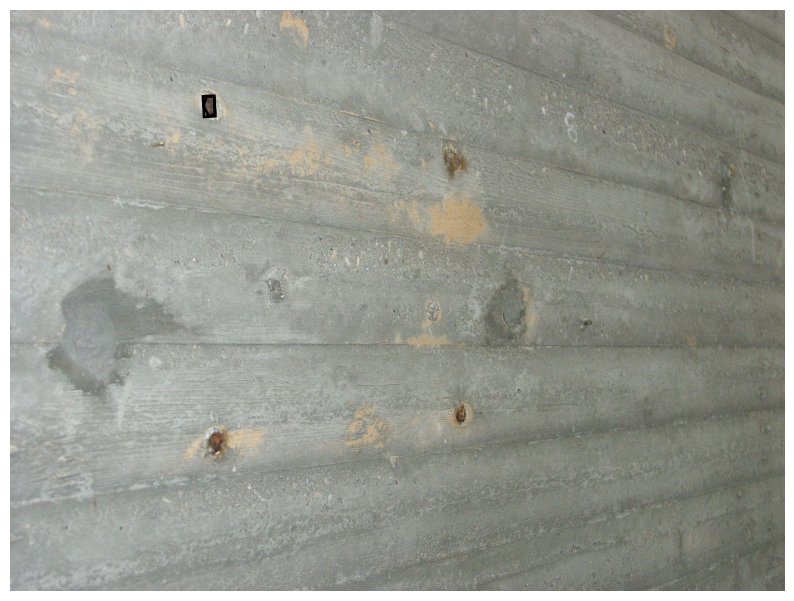

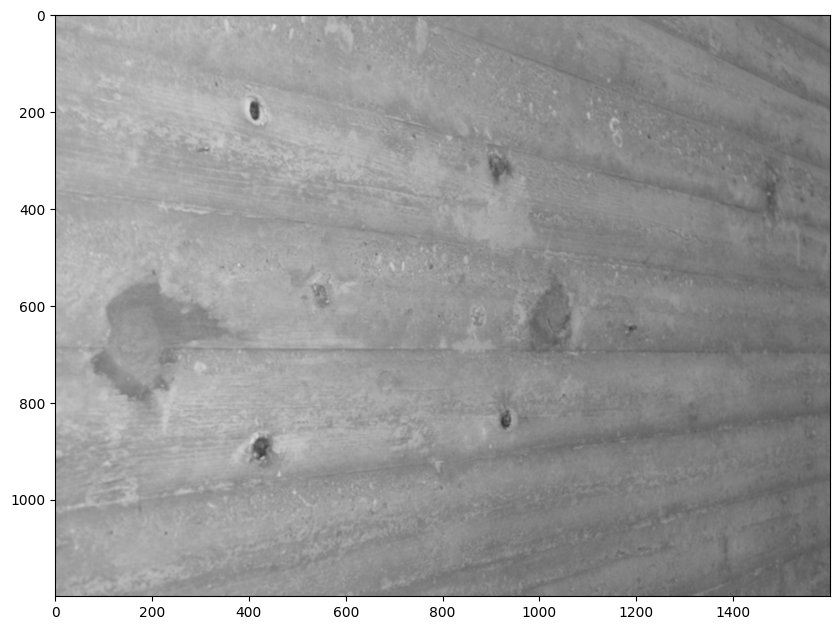

In [124]:
i = str(450).zfill(4)

# Read in image:
image_path = f"data/dacl10k_v2_devphase/images/train/dacl10k_v2_train_{i}.jpg"
image = cv2.imread(image_path, cv2.IMREAD_COLOR)

# Read in defects:
annotations_path = f"data/dacl10k_v2_devphase/annotations/train/dacl10k_v2_train_{i}.json"
with open(annotations_path, 'r') as file:
    annotations = json.load(file)
defects = annotations['shapes']

# Construct defect polygon:
defect_polygon = np.array(defects[1]['points'], dtype = np.int32)
visualize_image_with_defect(image, defect_polygon)

# Apply functions:
#hough_lines_detector(image)
#metallic_image = metallic_image_filter(image)
#colorful_image = colorful_image_filter(image)
#black_image = black_image_filter(image)
#black_thin_quotient = extract_black_thin_feature(black_image, defect_polygon)
#lbp, rough_image = rough_image_filter(image)
#lbp_value_quotients, texture_entropy = extract_rough_features_1(lbp, defect_polygon)
circular_image_filter(image)







In [107]:
print(lbp_value_quotients)
print(texture_entropy)

[0.05479811221814368, 0.062052088795665095, 0.0749431917496941, 0.12012760006991785, 0.17759133018703024, 0.11243663695158189, 0.08136689389966789, 0.07708442579968537, 0.07642894598846356, 0.16317077434015032]
3.2129749327281765


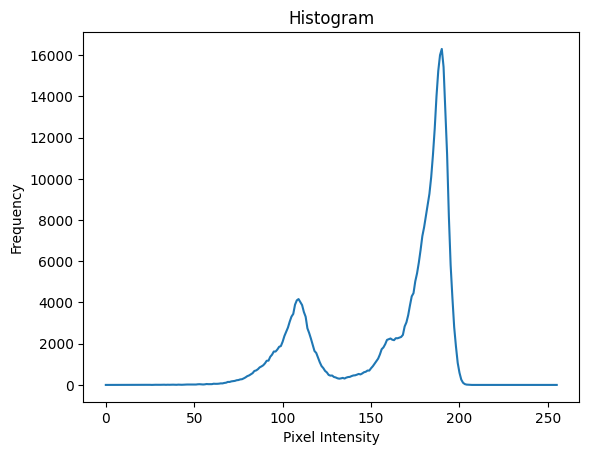

Histogram-based contrast: 2546.585007192401


In [330]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def histogram_analysis(image_path, defect_polygon):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask, [defect_polygon], 255)

    hist = cv2.calcHist([image], [0], mask, [256], [0, 256])
    
    plt.plot(hist)
    plt.title("Histogram")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.show()
    
    # Calculate contrast as the spread of the histogram
    pixel_values = np.arange(256)
    mean_intensity = np.mean(image)
    contrast = np.sqrt(np.mean((pixel_values - mean_intensity) ** 2 * hist[:, 0]))
    
    return contrast

i = str(2487).zfill(4)

# Read in image:
image_path = f"data/dacl10k_v2_devphase/images/train/dacl10k_v2_train_{i}.jpg"
image = cv2.imread(image_path, cv2.IMREAD_COLOR)

# Read in defects:
annotations_path = f"data/dacl10k_v2_devphase/annotations/train/dacl10k_v2_train_{i}.json"
with open(annotations_path, 'r') as file:
    annotations = json.load(file)
defects = annotations['shapes']

# Construct defect polygon:
defect_polygon = np.array(defects[0]['points'], dtype = np.int32)

# Example usage
contrast = histogram_analysis(image_path, defect_polygon)
print(f"Histogram-based contrast: {contrast}")


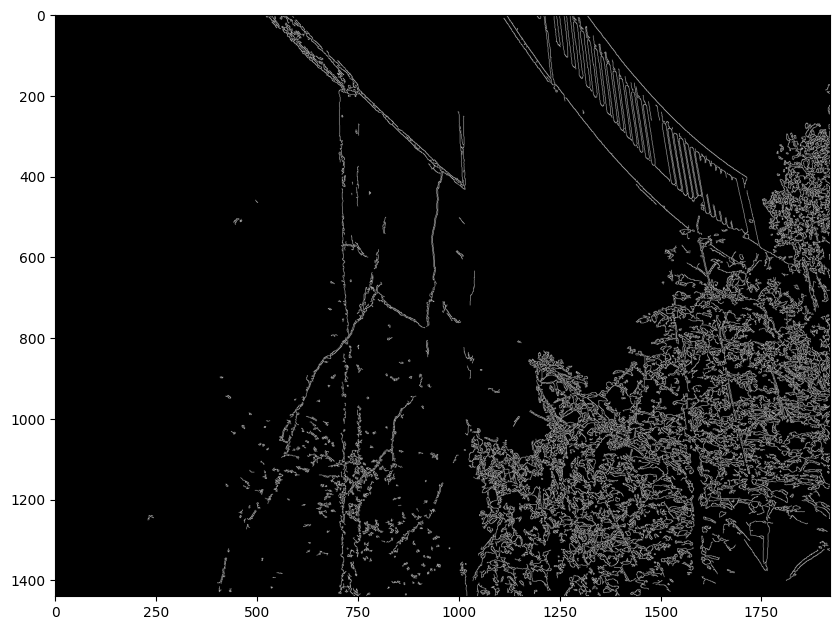

[[255 255 255 ...   0   0   0]
 [255 255 255 ...   0   0   0]
 [255 255 255 ...   0   0   0]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


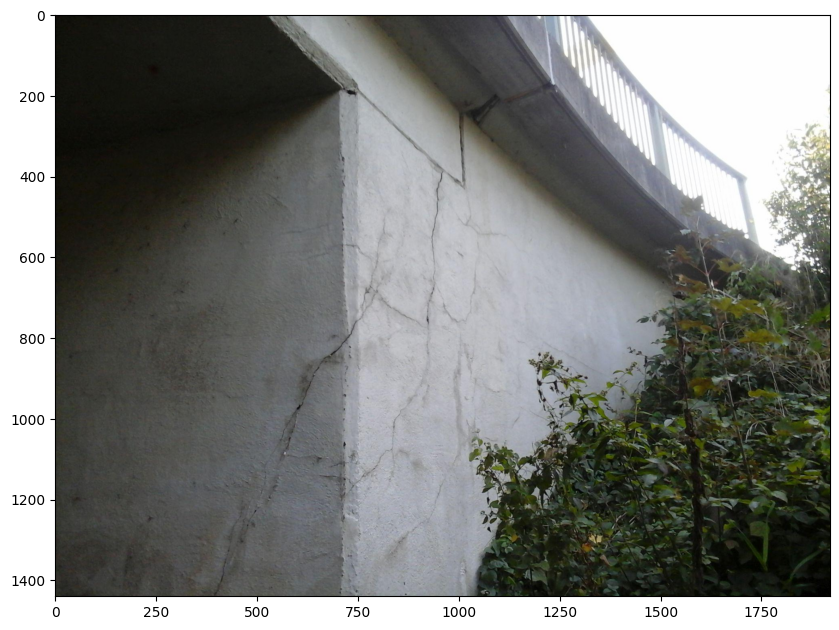

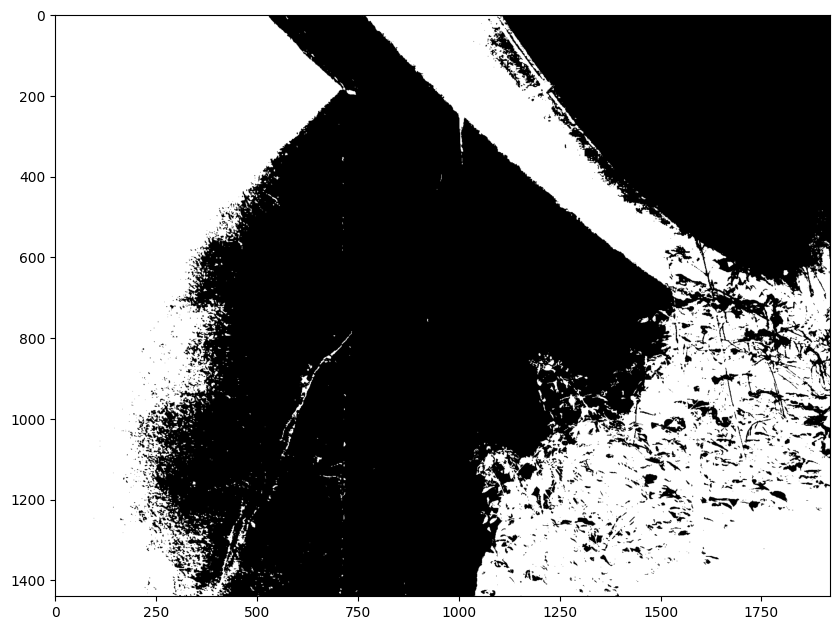

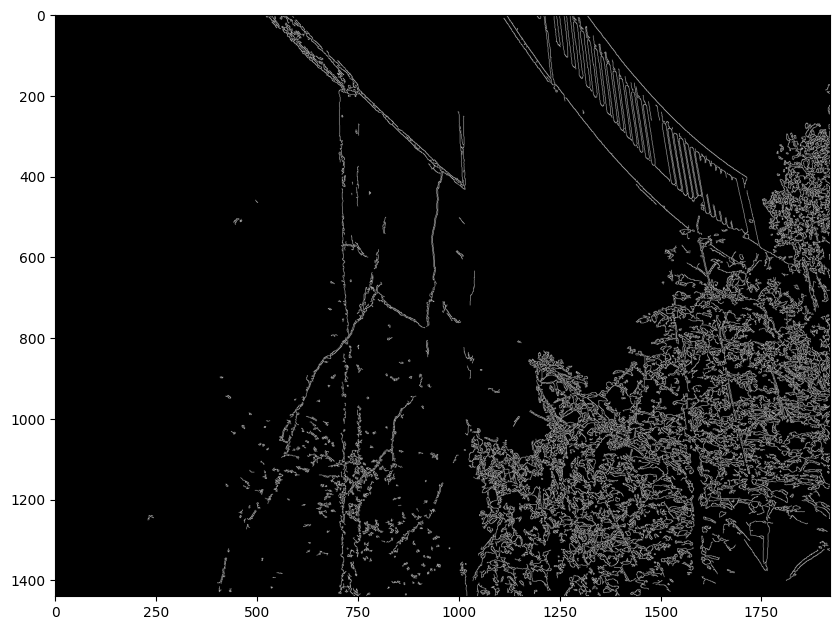

In [314]:
i = str(2487).zfill(4)

# Read in image:
image_path = f"data/dacl10k_v2_devphase/images/train/dacl10k_v2_train_{i}.jpg"
image = cv2.imread(image_path, cv2.IMREAD_COLOR)

# Read in defects:
annotations_path = f"data/dacl10k_v2_devphase/annotations/train/dacl10k_v2_train_{i}.json"
with open(annotations_path, 'r') as file:
    annotations = json.load(file)
defects = annotations['shapes']

#image = sharpen_image(image)
#image = cv2.GaussianBlur(image, (5, 5), 0)

edges = cv2.Canny(image, 50, 150)
plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

black_image = black_image_filter(image)
plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg



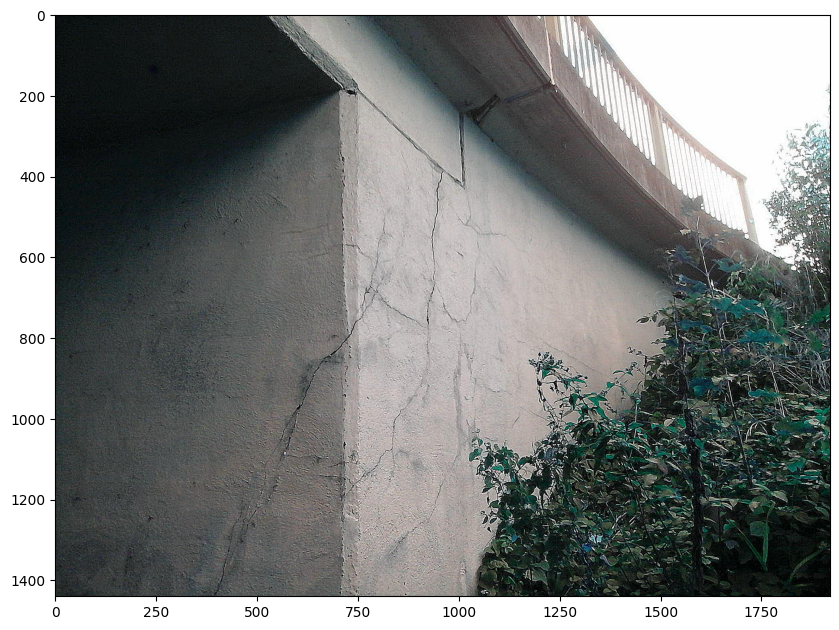

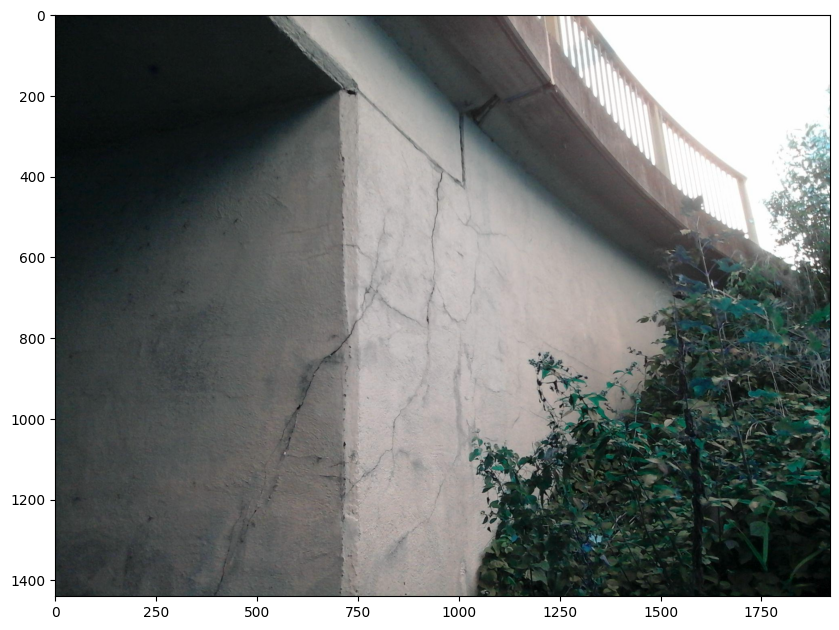

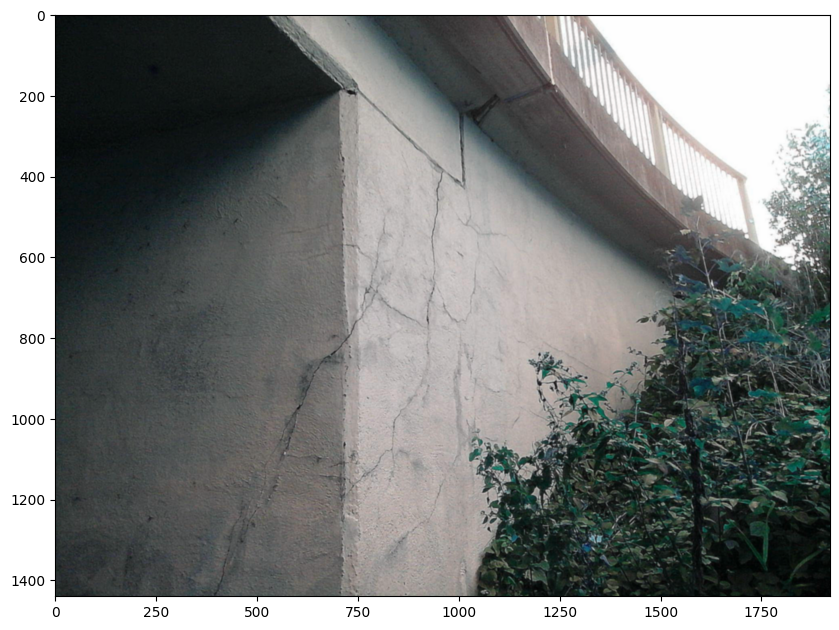

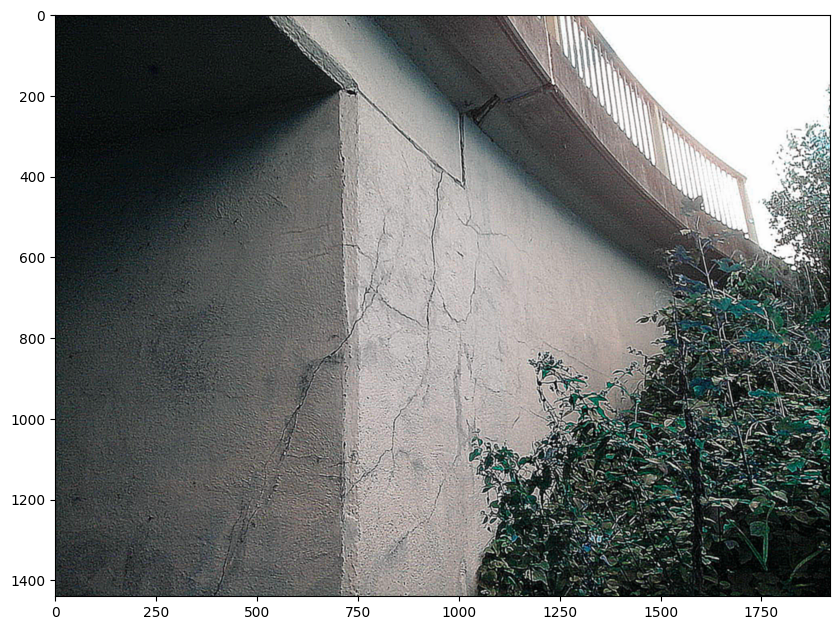

[[255 255 255 ...   0   0   0]
 [255 255 255 ...   0   0   0]
 [255 255 255 ...   0   0   0]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


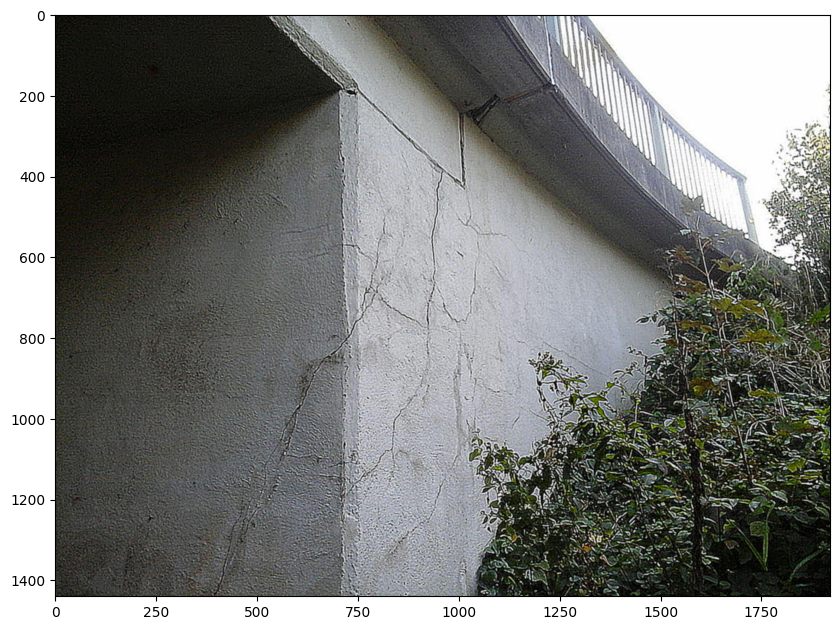

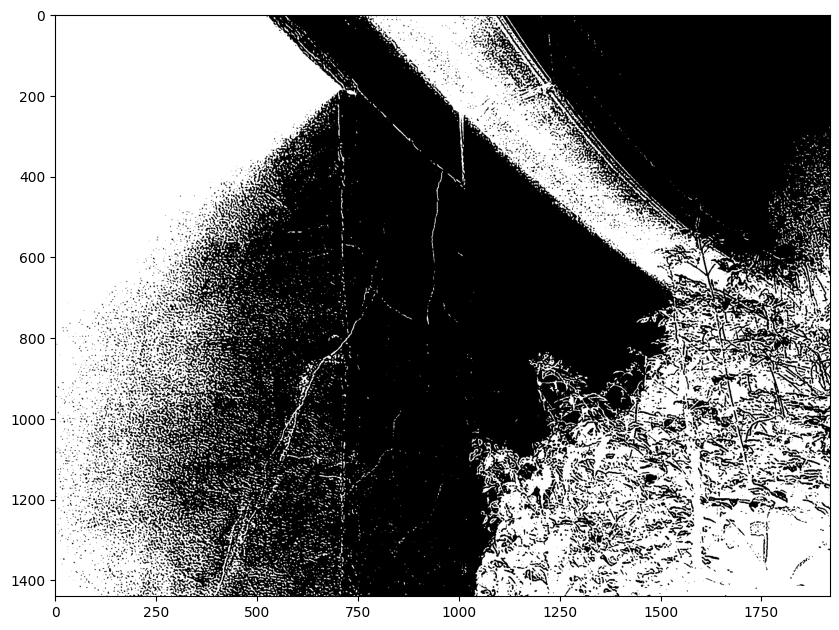

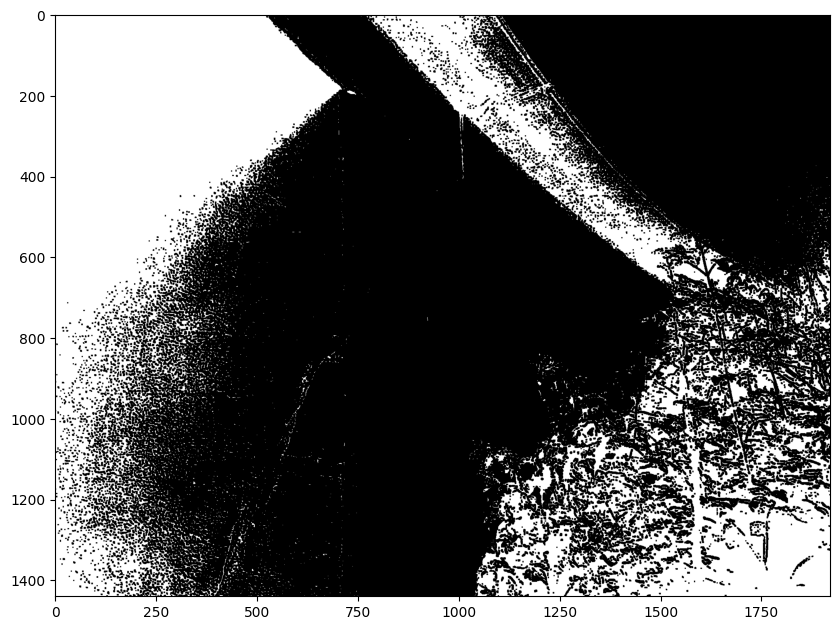

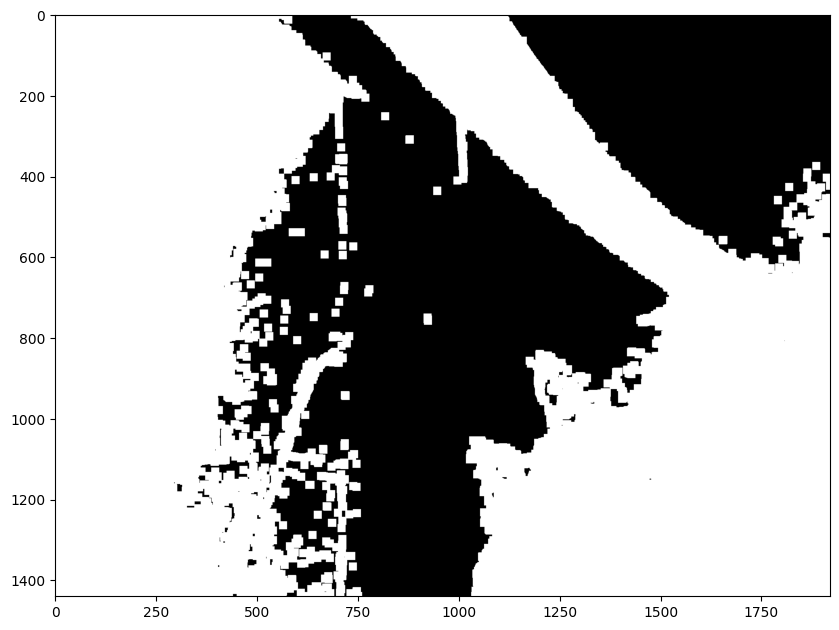

In [6]:
import cv2
import numpy as np

def sharpen_image(image):

    # Define a sharpening kernel
    sharpening_kernel = np.array([[-1, -1, -1],
                                  [-1,  9, -1],
                                  [-1, -1, -1]])

    # Apply the kernel to the image using cv2.filter2D
    sharpened_image = cv2.filter2D(image, -1, sharpening_kernel)
    
    return sharpened_image

# Example usage
i = str(2487).zfill(4)
image_path = f"data/dacl10k_v2_devphase/images/train/dacl10k_v2_train_{i}.jpg"
image = cv2.imread(image_path)
sharpened_image = sharpen_image(image)


plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(sharpened_image, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(image, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

image = cv2.GaussianBlur(sharpened_image, (7, 7), 0)

plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(image, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

sharpened_image = sharpen_image(image)
image = cv2.GaussianBlur(sharpened_image, (5, 5), 0)
sharpened_image = sharpen_image(image)
image = cv2.GaussianBlur(sharpened_image, (5, 5), 0)
sharpened_image = sharpen_image(image)

plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(image, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

black_image = black_image_filter(image)

kernel = np.ones((3, 3), np.uint8)
black_image = cv2.erode(black_image, kernel, iterations=1)

plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(cv2.cvtColor(black_image, cv2.COLOR_BGR2RGB), cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

kernel = np.ones((20, 20), np.uint8)
black_image = cv2.dilate(black_image, kernel, iterations=1)


# edges = cv2.Canny(sharpened_image, 600, 800)

plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(cv2.cvtColor(black_image, cv2.COLOR_BGR2RGB), cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg


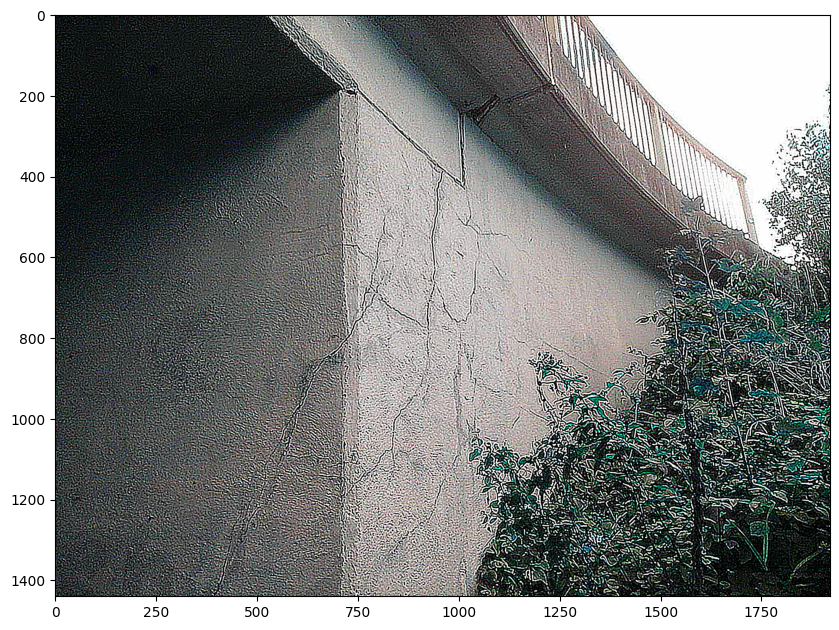

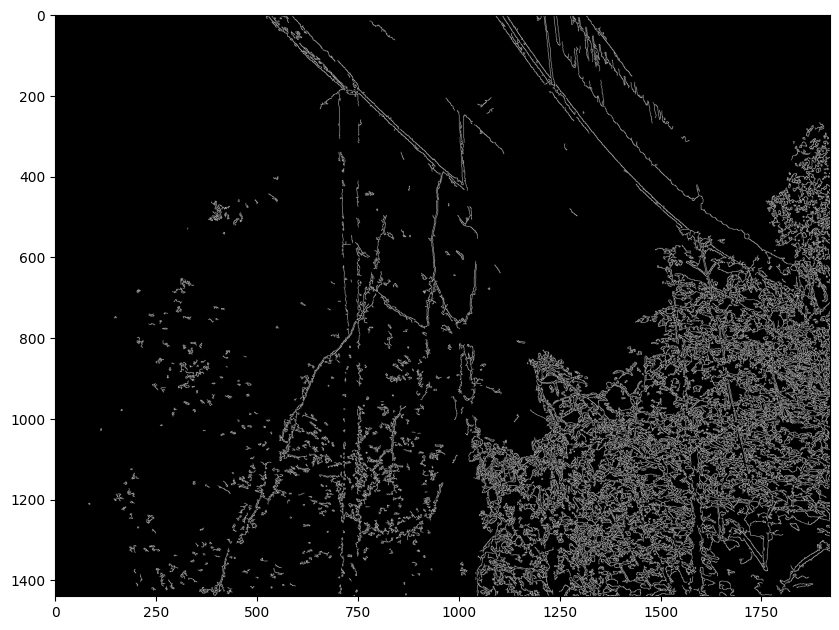

In [337]:
import cv2

def equalize_histogram_color(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to YUV color space
    yuv_image = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
    
    # Apply histogram equalization to the Y channel
    yuv_image[:, :, 0] = cv2.equalizeHist(yuv_image[:, :, 0])
    
    # Convert the image back to BGR color space
    equalized_image = cv2.cvtColor(yuv_image, cv2.COLOR_YUV2BGR)
    
    return equalized_image

# Example usage
i = str(2487).zfill(4)
image_path = f"data/dacl10k_v2_devphase/images/train/dacl10k_v2_train_{i}.jpg"
equalized_image = equalize_histogram_color(image_path)

# Display the original and equalized images
plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(sharpened_image, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

edges = cv2.Canny(equalized_image, 50, 150)
    
plt.figure(figsize=(10, 10)) # Nur zur Visualisierung -> Kann weg
plt.imshow(edges, cmap='gray') # Nur zur Visualisierung -> Kann weg
plt.show() # Nur zur Visualisierung -> Kann weg

black_image = black_image_filter(equalized_image)

